In [1]:
%%capture
import scikits.samplerate
import sklearn
import os
import site
site.addsitedir('/home/schirrmr/.local/lib/python2.7/site-packages/')
site.addsitedir('/usr/lib/pymodules/python2.7/')
os.sys.path.insert(0, '/home/schirrmr/braindecode/code/')
%cd /home/schirrmr/braindecode/code/braindecode/
assert 'THEANO_FLAGS' in os.environ
# switch to cpu
os.environ['THEANO_FLAGS'] = 'floatX=float32,device=cpu,nvcc.fastmath=True'
%load_ext autoreload
%autoreload 2
import logging
import theano.tensor as T
import lasagne
import logging
log = logging.getLogger()
log.setLevel("DEBUG")
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'png' 

import matplotlib.lines as mlines
import seaborn
seaborn.set_style('darkgrid')
matplotlib.rcParams['figure.figsize'] = (16.0, 1.0)
matplotlib.rcParams['font.size'] = 7
from braindecode.scripts.print_results import ResultPrinter
import theano
import scipy.signal
import numpy as np
from braindecode.veganlasagne.layer_util import print_layers

In [2]:
ResultPrinter('data/models/paper/ours/cnt/deep4/car/').print_results(sets=True,
                                                                     params=dict(low_cut_off_hz='null', first_nonlin='$elu',
                                    double_time_convs=False,
                                    sensor_names='$all_EEG_sensors'))

Printing results in data/models/paper/ours/cnt/deep4/car/:

Markdown Table

|id|filename|test_filename|time|test|test_sample|best|epoch|train|valid|
|-|-|-|-|-|-|-|-|-|-|
|47|BhNo1-12|BhNo1-2|1:29:42|98.75%|95.65%|98.75%|171|99.67%|100.00%|
|48|LuFi1-11|LuFi1-2|1:20:58|81.25%|78.09%|89.38%| 64|99.75%|100.00%|
|58|AnWe1-12|AnWe1-2|0:52:02|51.88%|46.69%|55.62%| 41|91.12%|85.87%|
|59|FaMa1-14|FaMa1-2|3:39:06|82.50%|78.55%|88.12%|446|99.43%|97.70%|
|60|FrTh1-11|FrTh1-2|1:24:15|85.62%|81.67%|91.88%|153|99.66%|100.00%|
|61|GuJo1-11|GuJo1-2|0:49:40|83.12%|77.48%|87.50%|105|100.00%|100.00%|
|62|JoBe1-11|JoBe1-2|1:08:51|86.88%|79.13%|86.88%|115|99.89%|100.00%|
|63|KaUs1-11|KaUs1-2|0:52:39|90.62%|86.91%|93.75%| 49|99.89%|100.00%|
|64|LaKa1-9|LaKa1-2|0:38:01|85.00%|82.86%|90.62%| 52|99.85%|100.00%|
|65|MaGl1-12|MaGl1-2|1:38:41|82.50%|77.33%|82.50%|180|99.27%|100.00%|
|66|MaJa1-11|MaJa1-2|0:48:58|89.38%|82.94%|91.25%| 97|100.00%|100.00%|
|67|MaVo1-11|MaVo1-2|1:16:48|90.00%|88.68%|94.38%| 58|100.00

In [3]:
from braindecode.experiments.experiment import create_experiment
from braindecode.experiments.load import load_exp_and_model

#basename = 'data/models/paper/bci-competition/cnt/deep4/147'
basename = 'data/models/paper/ours/cnt/deep4/car/47'
exp, model = load_exp_and_model(basename)

INFO:braindecode.experiments.experiment:Setting n_sample preds automatically to 479
INFO:braindecode.experiments.experiment:Input window length is 522
INFO:braindecode.experiments.experiment:Setting n_sample preds automatically to 479
INFO:braindecode.experiments.experiment:Input window length is 522


In [6]:
from braindecode.datasets.sensor_positions import tight_C_positions, tight_cap_positions
sensor_names = np.array(exp.dataset.train_set.sensor_names)
sensor_map = tight_cap_positions

i_sensor = np.where(sensor_names == 'FCC4h')[0][0]



In [12]:
from braindecode.results.results import ResultPool
import os.path
result_pool = ResultPool()

result_pool.load_results('data/models/paper/ours/cnt/deep4/car/', start=40,
                         params=dict(low_cut_off_hz='null', first_nonlin='$elu',
                                    double_time_convs=False,
                                    sensor_names='$all_EEG_sensors'))

res_file_names = result_pool.result_file_names()
topo_corrs_per_person = []

for file_name in res_file_names:
    env_corr_filename = file_name.replace('.result.pkl', '.env_corrs.npy')
    assert os.path.isfile(env_corr_filename)
    if '47' in file_name: # this is BhNo
        # 3rd filterband is 7-13
        sorted_units = np.argsort(topo_corrs[i_sensor][3])
    topo_corrs = np.load(env_corr_filename)
    topo_corrs_per_person.append(topo_corrs)
    
topo_corrs_per_person = np.array(topo_corrs_per_person)

In [13]:
i_sensors_with_c = np.array(['C' in name for name in sensor_names])

In [14]:
# meaning over units and persons
meaned_abs_corrs = np.mean(np.abs(topo_corrs_per_person), axis=(0,3))

In [15]:
filterbands = np.load('data/models/paper/ours/cnt/deep4/car/47.filt_bands.npy')

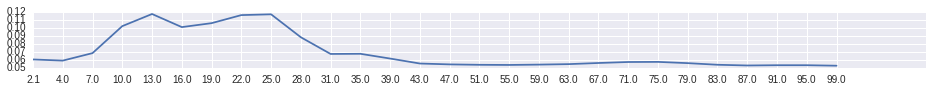

In [16]:
plt.plot(np.mean(meaned_abs_corrs, axis=(0)))
plt.xticks(range(len(filterbands)), np.mean(filterbands, axis=1))
None

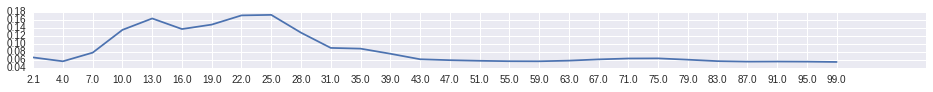

In [17]:
plt.plot(np.mean(meaned_abs_corrs[i_sensors_with_c], axis=(0)))
plt.xticks(range(len(filterbands)), np.mean(filterbands, axis=1))
None

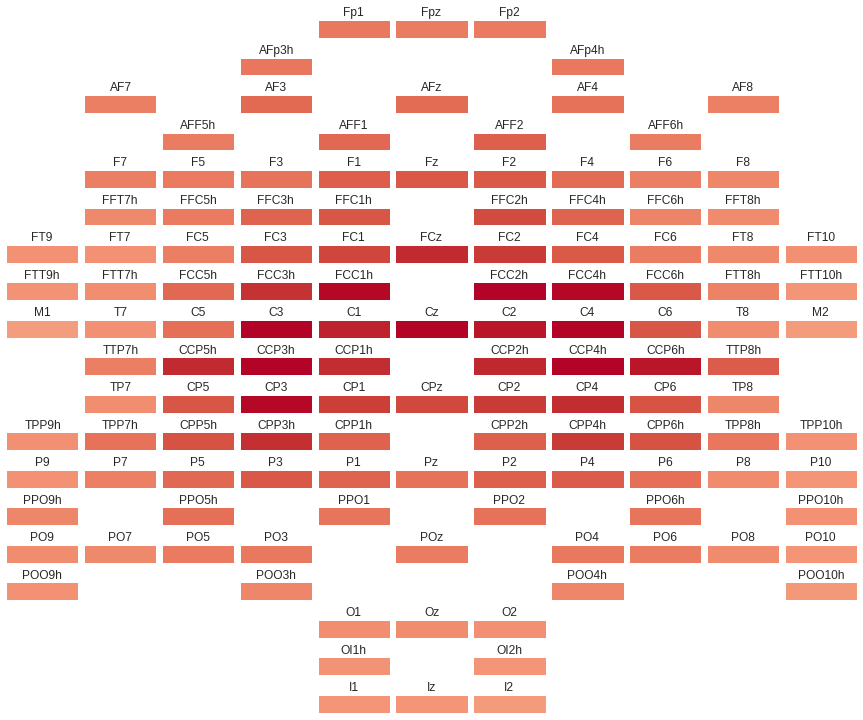

In [19]:
from braindecode.analysis.plot_util import plot_chan_matrices
meaned_per_sensor = np.mean(meaned_abs_corrs, axis=1)[:,np.newaxis, np.newaxis]
fig = plot_chan_matrices(meaned_per_sensor,
                        sensor_names, sensor_map=sensor_map,
                  colormap=cm.coolwarm,  figsize=(12,10), vmin=-0.1, vmax=0.1)
plt.yticks([])
plt.tight_layout()

In [20]:
from braindecode.mywyrm.plot import ax_scalp

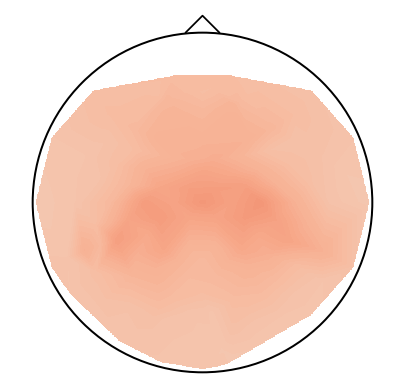

In [27]:
plt.figure(figsize=(7,7))
abs_mean = np.mean(np.abs(np.mean(meaned_per_sensor)))
ax_scalp(meaned_per_sensor.squeeze(),sensor_names, colormap=cm.coolwarm, vmin=-3*abs_mean,
        vmax=3*abs_mean)

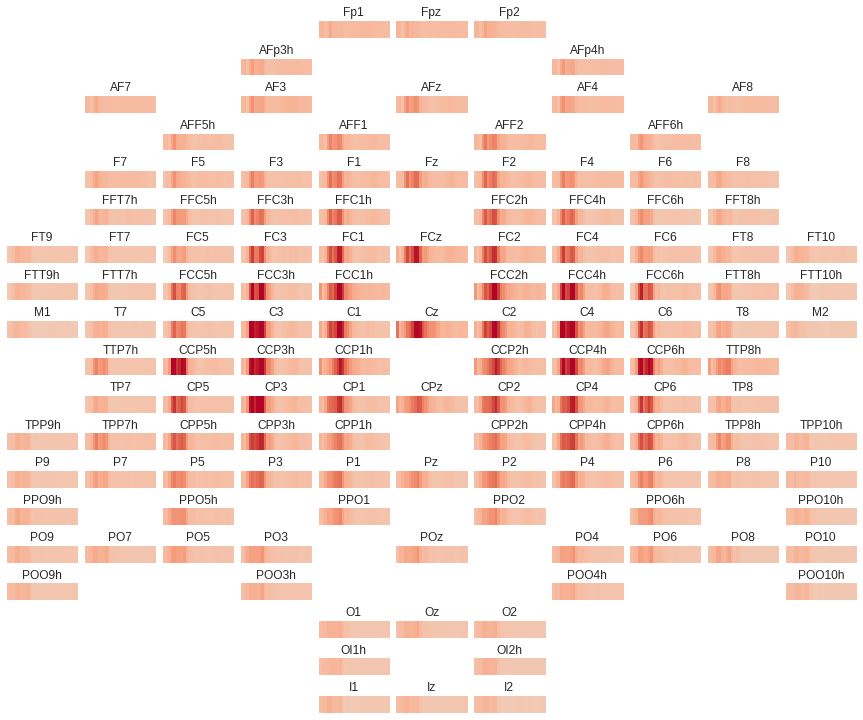

In [81]:
fig = plot_chan_matrices(meaned_abs_corrs[:,:,np.newaxis],
                        sensor_names, sensor_map=sensor_map,
                  colormap=cm.coolwarm,  figsize=(12,10), vmin=-0.2, vmax=0.2)
plt.yticks([])
plt.tight_layout()

INFO:root:BhNo
INFO:root:LuFi
INFO:root:AnWe
INFO:root:FaMa
INFO:root:FrTh
INFO:root:GuJo
INFO:root:JoBe
INFO:root:KaUs
INFO:root:LaKa
INFO:root:MaGl
INFO:root:MaJa
INFO:root:MaVo
INFO:root:MaKi
INFO:root:PiWi
INFO:root:NaMa
INFO:root:RoBe
INFO:root:RoSc
INFO:root:StHe
INFO:root:SvMu
INFO:root:OlIl


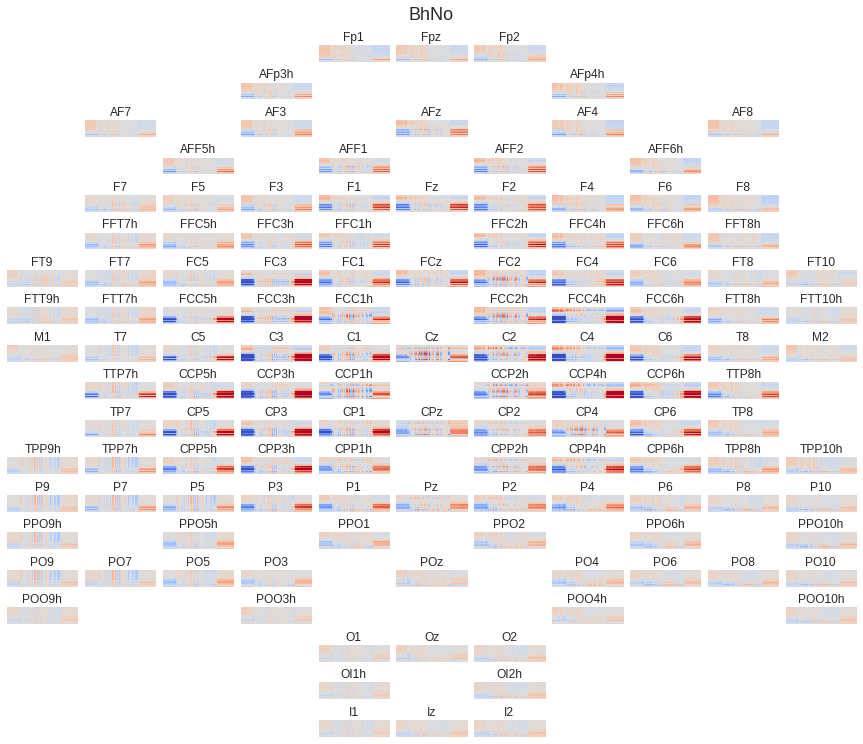

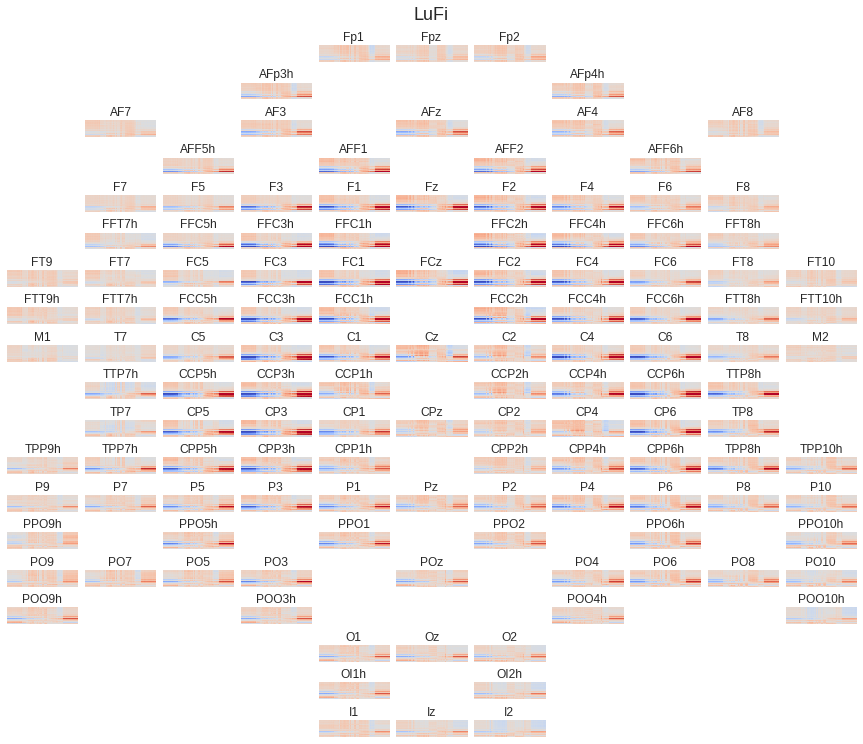

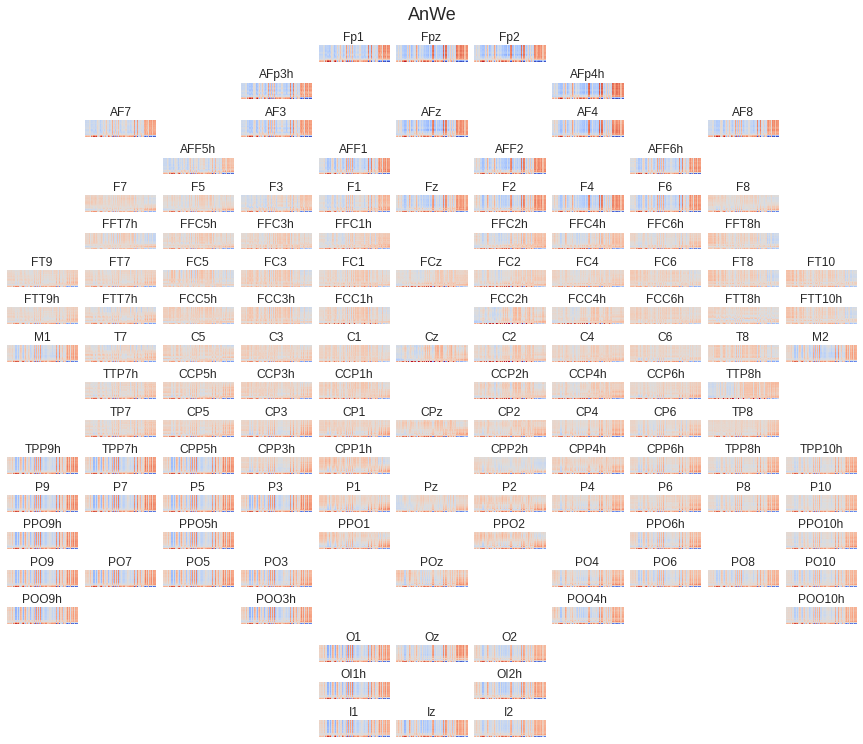

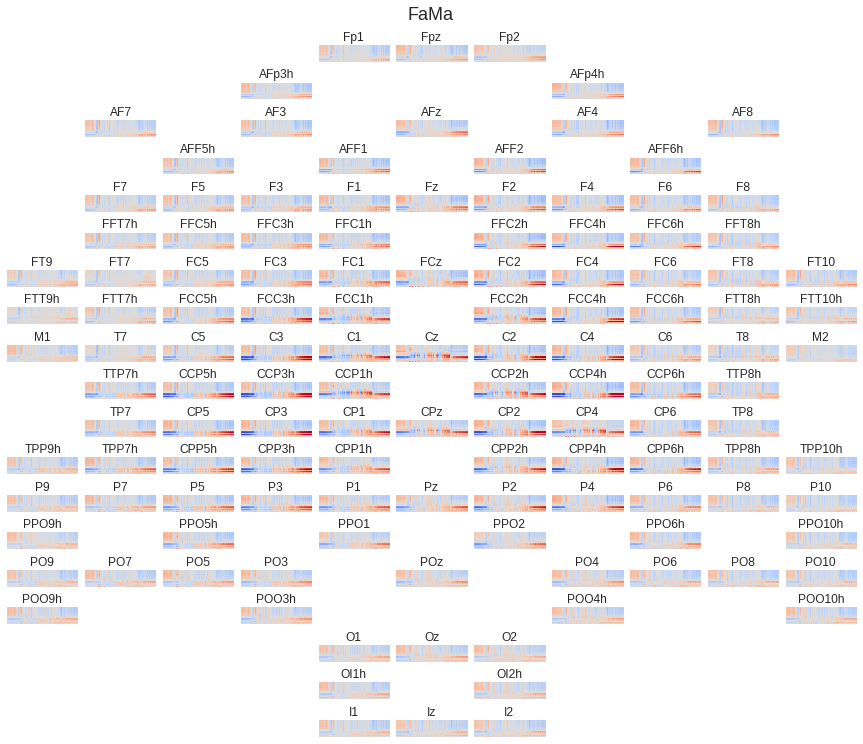

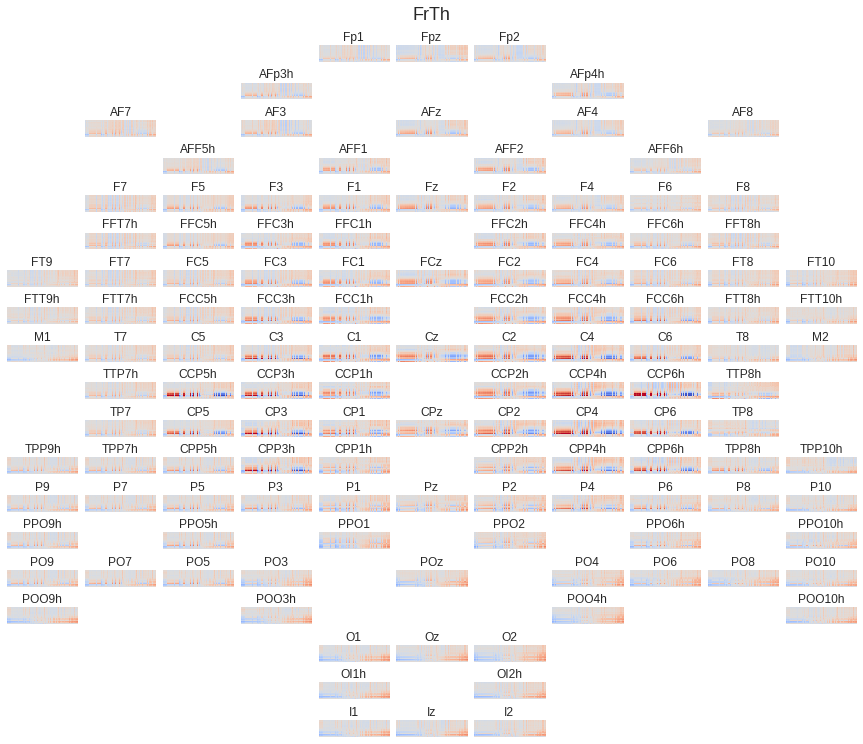

...

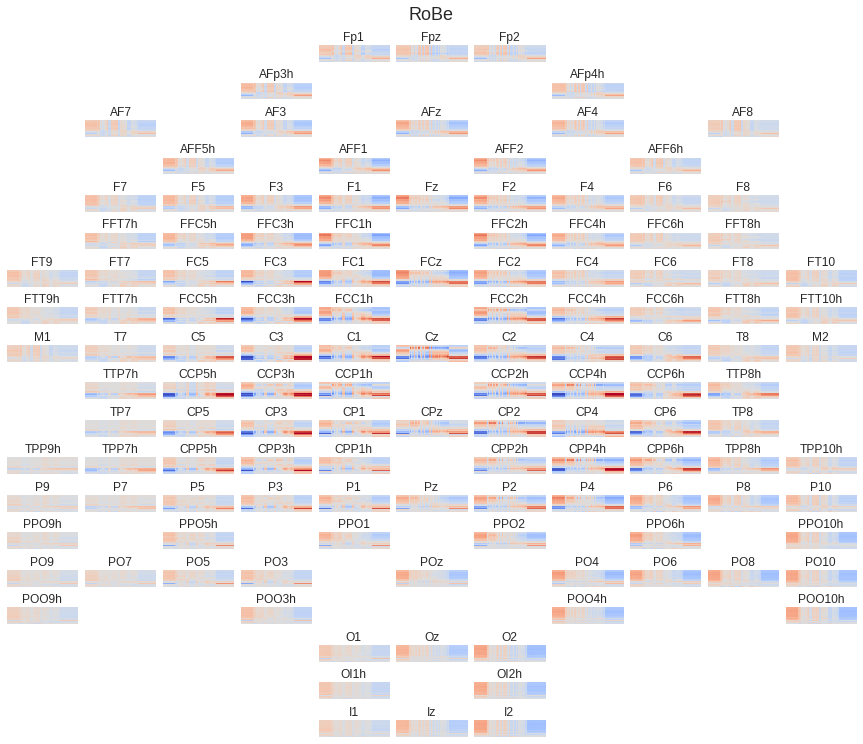

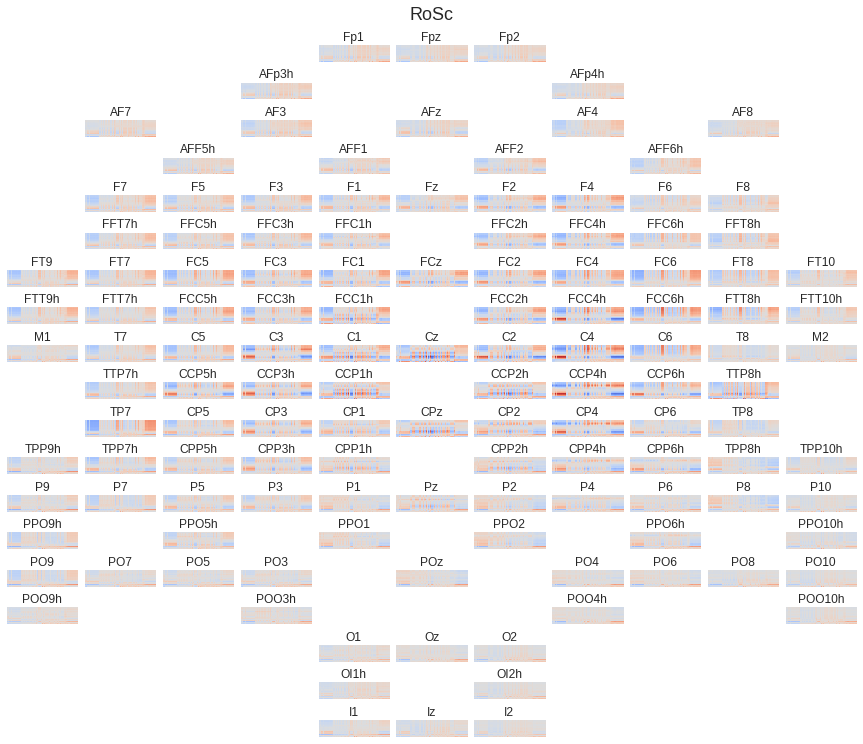

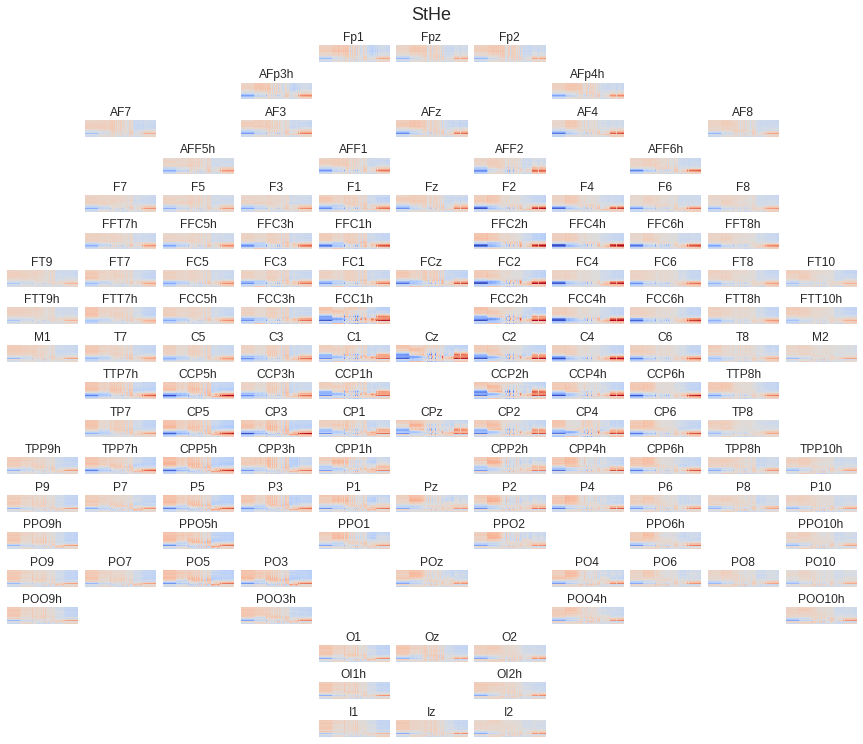

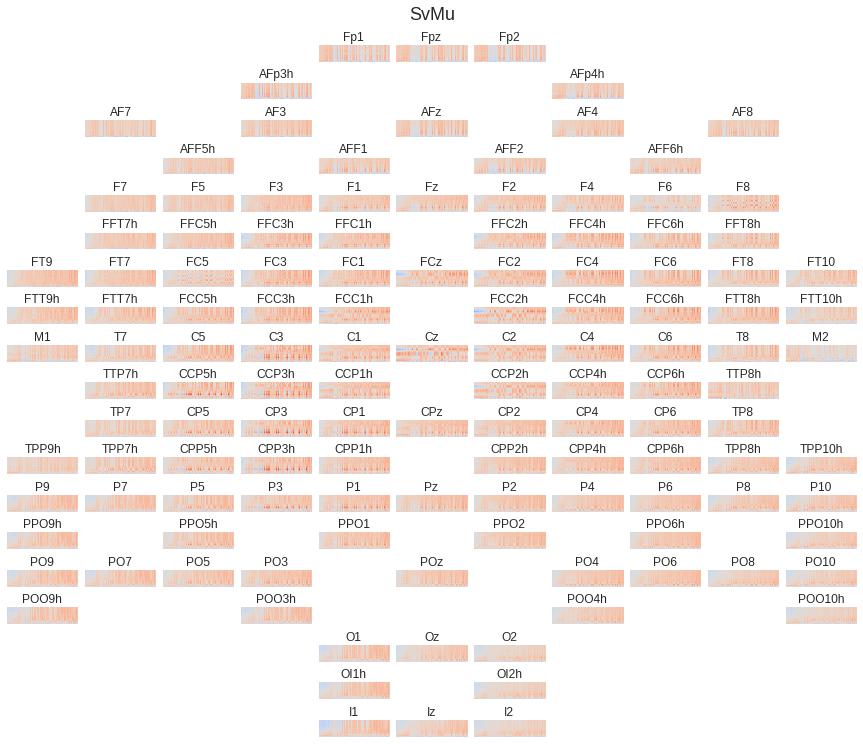

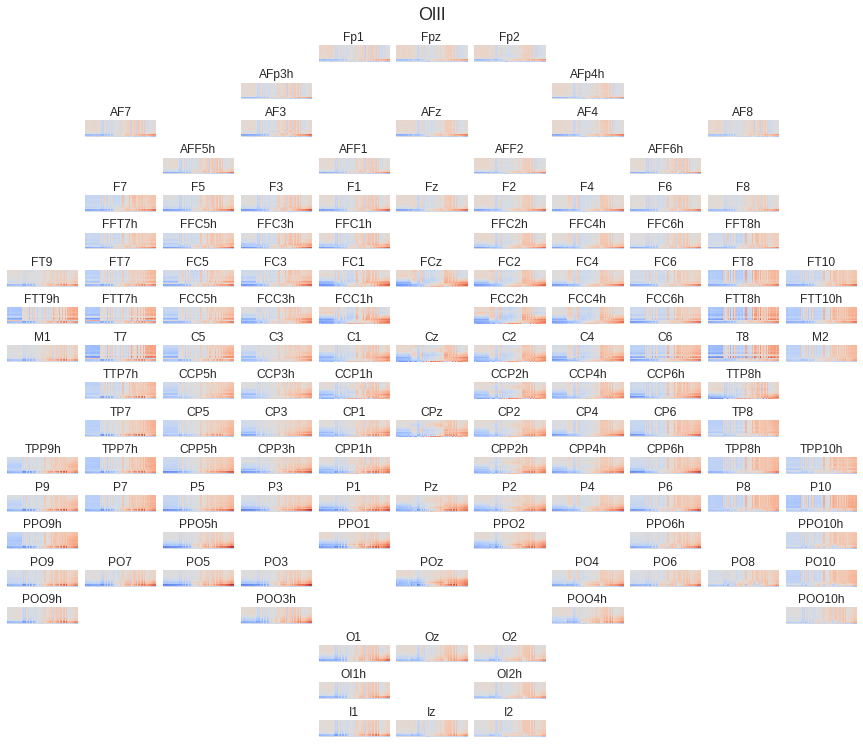

In [91]:
for topo_corrs, result  in zip(topo_corrs_per_person, 
                               result_pool.result_objects()):
    person = result.parameters['dataset_filename'].split('/')[-1][:4]
    log.info("{:s}".format(person))
    # 3rd filterband is 7-13
    sorted_units = np.argsort(topo_corrs[i_sensor][3])
    fig = plot_chan_matrices(topo_corrs[:,:,sorted_units].transpose(0,2,1),
                            sensor_names, sensor_map=sensor_map,
                      colormap=cm.coolwarm,  figsize=(12,10), vmin=-0.5, vmax=0.5)
    fig.suptitle(person,y=1.025,fontsize=18)
    plt.yticks([])
    plt.tight_layout()

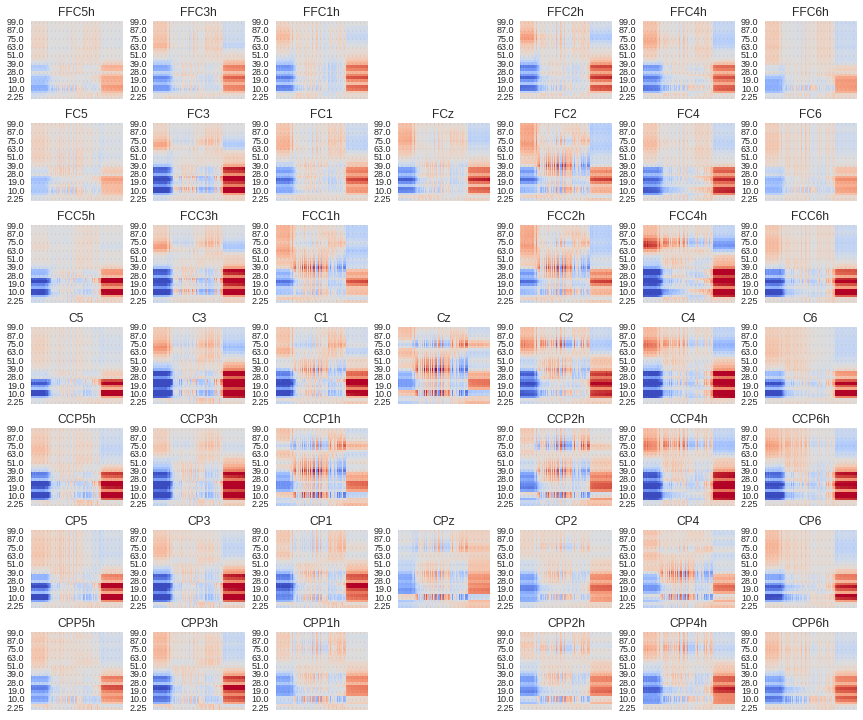

In [17]:
from braindecode.analysis.plot_util import plot_chan_matrices
fig = plot_chan_matrices(topo_corrs[:,:,sorted_units].transpose(0,2,1),
                        sensor_names, sensor_map=sensor_map,
                  colormap=cm.coolwarm,  figsize=(12,10), vmin=-0.5, vmax=0.5)
plt.yticks(np.arange(len(filterbands))[::3] + 0.5, np.mean(filterbands, axis=1)[::3])

for ax in fig.axes:
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(9)
plt.tight_layout()
None

In [110]:
from braindecode.datasets.sensor_positions import (tight_C_positions,
                                                   tight_bci_comp_4_2a_positions,
                                                   get_bci_competition_iv_2a_sensors,
                                                   )
filterbands = np.load(basename + '.filt_bands.npy')


[autoreload of braindecode.datasets.sensor_positions failed: Traceback (most recent call last):
  File "/home/schirrmr/motor-imagery/ipython-notebooks-metagpu/venv/local/lib/python2.7/site-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
TypeError: list indices must be integers, not tuple
]


In [111]:
from braindecode.veganlasagne.layer_util import compute_trial_acts
rand_trial_acts = compute_trial_acts(exp.final_layer, i_layer, exp.iterator, train_set)

INFO:braindecode.veganlasagne.layer_util:Create theano function...
INFO:braindecode.veganlasagne.layer_util:Compute activations...
INFO:braindecode.veganlasagne.layer_util:Transform to trial activations...
INFO:braindecode.veganlasagne.layer_util:Done.


In [112]:
rand_topo_corrs = compute_topo_corrs(trial_env, rand_trial_acts)

In [114]:
rand_sorted_units = np.argsort(rand_topo_corrs[i_sensor][3])

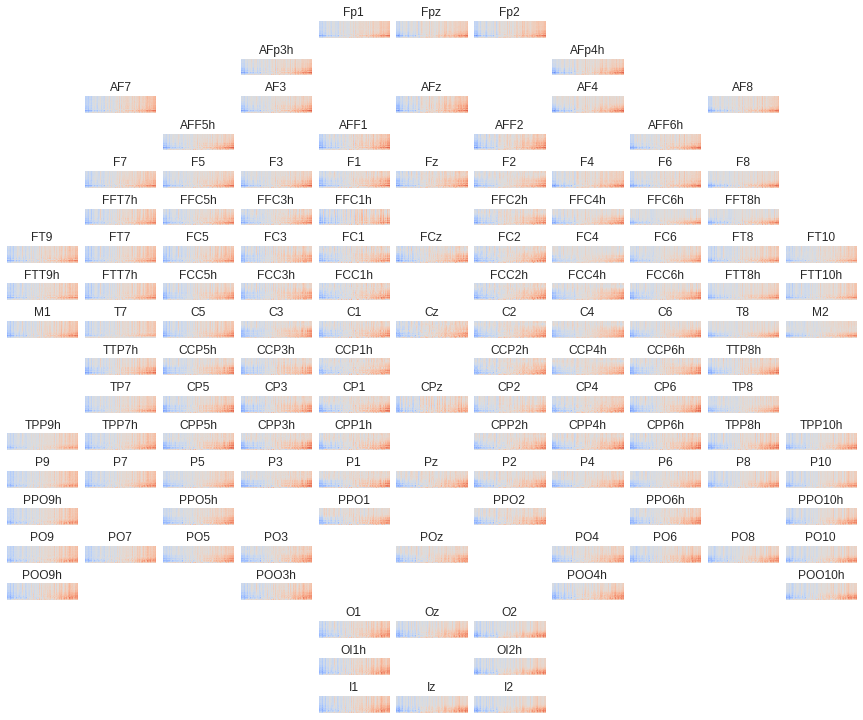

In [116]:
from braindecode.analysis.plot_util import plot_chan_matrices
fig = plot_chan_matrices(rand_topo_corrs[:,:,rand_sorted_units].transpose(0,2,1),
                        sensor_names, sensor_map=sensor_map,
                  colormap=cm.coolwarm,  figsize=(12,10), vmin=-0.5, vmax=0.5)
#plt.yticks(np.arange(len(filterbands))[::3] + 0.5, np.mean(filterbands, axis=1)[::3])

#for ax in fig.axes:
#    for tick in ax.yaxis.get_major_ticks():
#        tick.label.set_fontsize(9)
plt.yticks([])
plt.tight_layout()
None

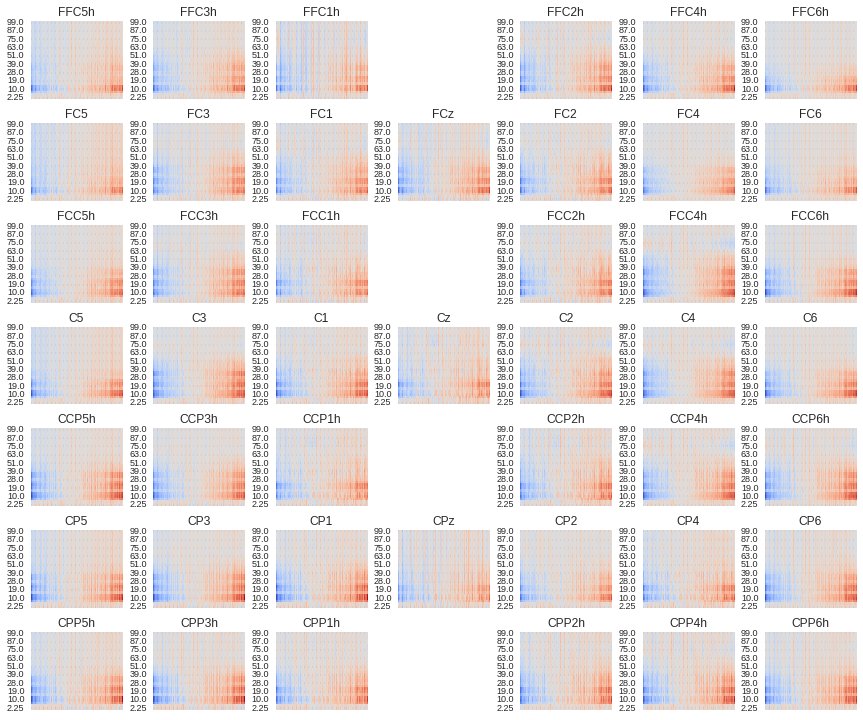

In [18]:
from braindecode.analysis.plot_util import plot_chan_matrices
fig = plot_chan_matrices(rand_topo_corrs[:,:,rand_sorted_units].transpose(0,2,1),
                        sensor_names, sensor_map=sensor_map,
                  colormap=cm.coolwarm,  figsize=(12,10), vmin=-0.5, vmax=0.5)
plt.yticks(np.arange(len(filterbands))[::3] + 0.5, np.mean(filterbands, axis=1)[::3])

for ax in fig.axes:
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(9)
plt.tight_layout()
None

In [ ]:
from braindecode.analysis.plot_util import plot_chan_matrices
fig = plot_chan_matrices(rand_topo_corrs_scaled[:,:,rand_sorted_units].transpose(0,2,1),
                        sensor_names, sensor_map=sensor_map,
                  colormap=cm.coolwarm,  figsize=(12,10), vmin=-0.5, vmax=0.5)
plt.yticks(np.arange(len(filterbands))[::3] + 0.5, np.mean(filterbands, axis=1)[::3])

for ax in fig.axes:
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(9)
plt.tight_layout()
None

In [120]:
from braindecode.analysis.plot_util import plot_sensor_signals

### Heatmaps attempts

In [7]:
from lasagne.layers import Conv2DLayer, Pool2DLayer, InputLayer
from braindecode.veganlasagne.layers import StrideReshapeLayer, FinalReshapeLayer, NonlinearityLayer
from lasagne.nonlinearities import elu, softmax
from braindecode.veganlasagne.layers import get_n_sample_preds
from braindecode.veganlasagne.stopping import MaxEpochs
from copy import deepcopy
new_exp = deepcopy(exp)

AttributeError: 'CntSignalMatrix' object has no attribute 'compress'

In [6]:
l = InputLayer([None,1,20,2])
l = Conv2DLayer(l,num_filters=2, filter_size=(8,1), nonlinearity=None)
l = Conv2DLayer(l, num_filters=2,filter_size=(1,2), nonlinearity=elu)
l = StrideReshapeLayer(l,2)
l = FinalReshapeLayer(l)
l = NonlinearityLayer(l, nonlinearity=softmax)

In [ ]:
from braindecode.datasets.random import RandomSet
from braindecode.datahandling.splitters import FixedTrialSplitter

In [ ]:
new_exp.iterator.n_sample_preds = get_n_sample_preds(l)
new_exp.iterator.input_time_length = 20
new_exp.monitors[2].n_sample_preds = get_n_sample_preds(l)
new_exp.monitors[2].input_time_length = 20
new_exp.stop_criterion = MaxEpochs(5)
new_exp.updates_modifier = None
new_exp.final_layer = l

n_samples = 200000

new_exp.dataset = RandomSet((n_samples,1,1,2), (n_samples,2))
new_exp.dataset.load()
new_exp.dataset.y[:] = [0,0]
for i_sample in xrange(100,n_samples-400,400):
    new_exp.dataset.y[i_sample+20:i_sample+100] = [0,1]
    new_exp.dataset.X[i_sample:i_sample+100] = [0,1]
    
    new_exp.dataset.y[i_sample+220:i_sample+300] = [1,0]
    new_exp.dataset.X[i_sample+200:i_sample+300] = [1,0]
new_exp.dataset_provider.dataset_splitter = FixedTrialSplitter(int(n_samples * 0.7),0.4)

In [ ]:
new_exp.setup()

In [ ]:
new_exp.run_until_early_stop()

In [ ]:
layers_after_stride = lasagne.layers.get_all_layers(l.input_layer.input_layer)

In [ ]:
l.input_layer.input_layer.output_shape

In [3]:
l.input_layer.input_layer.input_layer.output_shape

NameError: name 'l' is not defined

In [15]:
from braindecode.analysis.heatmap import create_heatmap_fn

In [514]:
heat_fn = create_heatmap_fn(layers_after_stride, rules=['adapt_z_b', 'adapt_z_b'])

In [515]:
heat_fn(np.ones([2,2,7,1], dtype=np.float32), np.ones((1,1,20,2), dtype=np.float32)).shape

(1, 1, 20, 2)

In [505]:
heat_fn = create_heatmap_fn(layers_after_stride[-3:-1], ['adapt_z_b', 'adapt_z_b'])

Not equal after Conv2DLayer, out Shape.0. in Shape.0


In [506]:
heat_fn(np.ones([1,2,13,1], dtype=np.float32), np.ones((1,1,20,2), dtype=np.float32)).shape

(1, 2, 13, 2)

In [299]:
l_after_stride[-1].output_shape

(None, 2, 7, 1)

In [502]:

conv_z_b_fn = create_back_conv_z_b_fn(-2,4)
out_rel = np.array([[[[3,4]]]], dtype=np.float32)
in_act = np.array([[[[1,-2,3]]]], dtype=np.float32)
weights = np.array([[[[-2,3]]]], dtype=np.float32)[:,:,::-1,::-1]
in_relevances = conv_z_b_fn(out_rel,in_act,weights)
assert np.allclose([[[[3,48/27.0,60/27.0]]]], in_relevances)

out_rel = np.array([[[[3,4],[-2,3]]]], dtype=np.float32)
in_act = np.array([[[[1,-2,3], [-1,2,-1.5]]]], dtype=np.float32)
weights = np.array([[[[-2,3]]]], dtype=np.float32)[:,:,::-1,::-1]
in_relevances = conv_z_b_fn(out_rel,in_act,weights)
assert np.allclose([[[[3,48/27.0,60/27.0],
                     [-10/11.0, (-12+24)/11.0, 9/11.0]]]], 
                     in_relevances)

In [306]:
heat_fn(np.ones([2,13,1], dtype=np.float32), np.ones((1,20,2), dtype=np.float32))

array([[[ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.23609352,  0.38120842],
        [ 0.39393783,  0.78344345],
        [ 0.55570936,  1.19568586],
        [ 0.68117905,  1.31882095],
        [ 0.68117905,  1.31882143],
        [ 0.68117905,  1.31882143],
        [ 0.68117905,  1.31882143],
        [ 0.68117905,  1.31882143],
        [ 0.68117905,  1.31882143],
        [ 0.68117905,  1.31882143],
        [ 0.68117905,  1.31882095],
        [ 0.68117905,  1.31882119],
        [ 0.68117905,  1.31882095],
        [ 0.44508541,  0.93761265],
        [ 0.2872411 ,  0.53537762],
        [ 0.12546968,  0.12313521],
        [ 0.        ,  0.        ]]], dtype=float32)

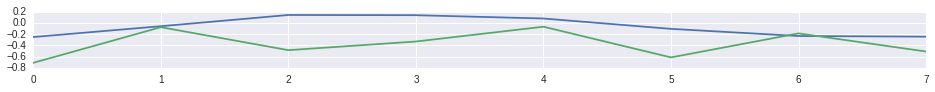

In [231]:
plt.plot(l.input_layer.input_layer.input_layer.input_layer.W.get_value().squeeze().T)

In [ ]:
# use http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0130140 -> 60 wiht α = +2, β = −1
# also here page 18: http://arxiv.org/pdf/1512.02479v1.pdf
# should be possible by already existing z+ rule (and adding bias there to norms(!)), making similar z- rule
# and adding both together with factors (rj miultiplied in already, should not be a problem)


# in dummy example put randomly "wrong" negative and positive parts into trials
# see whether heatmaps correctly reflect that...

In [124]:
import numpy as np
import theano
import theano.tensor as T
from braindecode.analysis.heatmap import (relevance_pool,
    create_back_conv_z_b_fn, create_back_conv_w_sqr_fn, create_back_dense_fn,
    create_back_conv_z_plus_fn)

from theano.tensor.nnet import conv2d


in_relevance = [[[[-1,-2,3]]]]
weights = [[[[1,-1]]]]
out_relevance = [[[[4,2]]]]







#create_heatmap_fn(layers, conv=RelevanceConvWSqr(), dense=RelevanceDenseAdaptZB(....))

def _forward_positive_z(inputs, weights, bias=None):
    inputs_plus = inputs * T.gt(inputs, 0)
    weights_plus = weights * T.gt(weights, 0)
    inputs_minus = inputs * T.lt(inputs, 0)
    weights_minus = weights * T.lt(weights, 0)
    plus_part_a = conv2d(inputs_plus, weights_plus)
    plus_part_b = conv2d(inputs_minus, weights_minus)

    together = plus_part_a + plus_part_b
    if bias is not None:
        bias_plus = bias * T.gt(bias, 0)
        together +=  bias_plus.dimshuffle('x',0,'x','x')
    
    return together
    
def _forward_negative_z(inputs, weights, bias=None):
    inputs_plus = inputs * T.gt(inputs, 0)
    weights_plus = weights * T.gt(weights, 0)
    inputs_minus = inputs * T.lt(inputs, 0)
    weights_minus = weights * T.lt(weights, 0)
    negative_part_a = conv2d(inputs_plus, weights_minus)
    negative_part_b = conv2d(inputs_minus, weights_plus)

    together = negative_part_a + negative_part_b
    if bias is not None:
        bias_negative = bias * T.lt(bias, 0)
        together +=  bias_negative.dimshuffle('x',0,'x','x')
    
    return together

def _backward_positive_z(inputs, weights, normed_relevances, bias=None):
    inputs_plus = inputs * T.gt(inputs, 0)
    weights_plus = weights * T.gt(weights, 0)
    inputs_minus = inputs * T.lt(inputs, 0)
    weights_minus = weights * T.lt(weights, 0)
    # Compute weights+ * inputs+ and weights- * inputs-
    positive_part_a = conv2d(normed_relevances, 
          weights_plus.dimshuffle(1,0,2,3)[:,:,::-1,::-1], 
          border_mode='full')
    positive_part_a *= inputs_plus
    positive_part_b = conv2d(normed_relevances, 
          weights_minus.dimshuffle(1,0,2,3)[:,:,::-1,::-1], 
          border_mode='full')
    positive_part_b *= inputs_minus
    
    together = positive_part_a + positive_part_b
    if bias is not None:
        bias_plus = bias * T.gt(bias, 0)
        bias_relevance = bias_plus.dimshuffle('x',0,'x','x') * normed_relevances
        # Divide bias by weight size before convolving back
        # mean across channel, 0, 1 dims (hope this is correct?)
        fraction_bias = bias_relevance / T.prod(weights.shape[1:]).astype(
            theano.config.floatX)
        bias_rel_in = conv2d(fraction_bias, 
          T.ones_like(weights).dimshuffle(1,0,2,3)[:,:,::-1,::-1], 
          border_mode='full') 
        together +=  bias_rel_in
    return together
    
def _backward_negative_z(inputs, weights, normed_relevances, bias=None):
    inputs_plus = inputs * T.gt(inputs, 0)
    weights_plus = weights * T.gt(weights, 0)
    inputs_minus = inputs * T.lt(inputs, 0)
    weights_minus = weights * T.lt(weights, 0)
    # Compute weights+ * inputs- and weights+ * inputs+
    negative_part_a = conv2d(normed_relevances, 
          weights_plus.dimshuffle(1,0,2,3)[:,:,::-1,::-1], 
          border_mode='full')
    negative_part_a *= inputs_minus
    negative_part_b = conv2d(normed_relevances, 
          weights_minus.dimshuffle(1,0,2,3)[:,:,::-1,::-1], 
          border_mode='full')
    negative_part_b *= inputs_plus
    
    together = negative_part_a + negative_part_b
    if bias is not None:
        bias_negative = bias * T.lt(bias, 0)
        bias_relevance = bias_negative.dimshuffle('x',0,'x','x') * normed_relevances
        # Divide bias by weight size before convolving back
        # mean across channel, 0, 1 dims (hope this is correct?)
        fraction_bias = bias_relevance / T.prod(weights.shape[1:]).astype(
            theano.config.floatX)
        bias_rel_in = conv2d(fraction_bias, 
          T.ones_like(weights).dimshuffle(1,0,2,3)[:,:,::-1,::-1], 
          border_mode='full') 
        together +=  bias_rel_in
    return together
    
    
def relevance_conv_stable_sign(inputs, weights, out_relevances, bias=None):
    negative_norm = _forward_negative_z(inputs, weights, bias)
    positive_norm = _forward_positive_z(inputs, weights, bias)
    
    # Set zeros to 1 to prevent division by 0
    positive_norm_nonzero = positive_norm + T.eq(positive_norm, 0)
    pos_minus_neg_nonzero = (positive_norm - negative_norm)
    pos_minus_neg_nonzero +=  T.eq(pos_minus_neg_nonzero, 0)
    positive_factor = (positive_norm - 2 * negative_norm) / (
        positive_norm_nonzero * pos_minus_neg_nonzero)
    
    positive_rel_normed = out_relevances * positive_factor
    negative_rel_normed = out_relevances / pos_minus_neg_nonzero
    
    in_rel_from_pos = _backward_positive_z(inputs, weights, positive_rel_normed, bias=bias)
    in_rel_from_neg = _backward_negative_z(inputs, weights, negative_rel_normed, bias=bias)
    return in_rel_from_pos + in_rel_from_neg
    

In [156]:
def relevance_conv_a_b(inputs, weights, out_relevances, a,b, bias=None):
    positive_norm = _forward_positive_z(inputs, weights, bias)
    negative_norm = _forward_negative_z(inputs, weights, bias)
    # set 0s to 1
    positive_norm_nonzero = positive_norm + T.eq(positive_norm, 0)
    # set 0s to -1
    negative_norm_nonzero = negative_norm - T.eq(negative_norm, 0)
    
    positive_rel_normed = out_relevances / positive_norm_nonzero
    # relevances now already negative :))
    negative_rel_normed = out_relevances / negative_norm_nonzero
    
    in_rel_from_pos = _backward_positive_z(inputs, weights, positive_rel_normed, bias=bias)
    in_rel_from_neg = _backward_negative_z(inputs, weights, negative_rel_normed, bias=bias)
    return a * in_rel_from_pos - b * in_rel_from_neg

In [158]:

inputs = T.ftensor4()
weights = T.ftensor4()
relevances = T.ftensor4()
bias = T.fvector()


in_rel = relevance_conv_a_b(inputs, weights, 
    relevances, a=2, b=1, bias=bias)

in_rel_fn = theano.function([inputs, weights, relevances, bias], in_rel)


In [163]:

in_relevance = in_rel_fn(np.array([[[[-1,-2,3]]]], dtype=np.float32), 
           np.array([[[[1,-1]]]], dtype=np.float32)[:,:,::-1,::-1],
           np.array([[[[4,2]]]], dtype=np.float32),
           np.array([0], dtype=np.float32))
assert np.allclose([[[[-4, 2*4 - 4/5.0,-6/5.0]]]], in_relevance)

In [162]:
in_relevance

array([[[[-4.        ,  7.19999981, -1.20000005]]]], dtype=float32)

In [151]:
### with negative bias
assert np.allclose([[[[-8/5.0, 32/5.0 - 4/5.0 - 6/7.0, -8/7.0]]]], in_relevance)

(-1.6, 4.742857142857144, -1.1428571428571428)

In [525]:
inputs = T.fvector()

inputs_plus = inputs * T.gt(inputs, 0)
plus_fn_a = theano.function([inputs], inputs_plus)



In [526]:
inputs = T.fvector()

inputs_plus = T.switch(T.gt(inputs, 0), inputs, T.zeros_like(inputs))
plus_fn_b = theano.function([inputs], inputs_plus)



In [534]:
%%timeit
plus_fn_a(np.array([1,-2,3], dtype=np.float32))

10000 loops, best of 3: 106 µs per loop


In [533]:
%%timeit
plus_fn_b(np.array([1,-2,3], dtype=np.float32))

The slowest run took 5.32 times longer than the fastest. This could mean that an intermediate result is being cached 
10000 loops, best of 3: 95.5 µs per loop
